# **Introduction**

## **AI vs Ml vs DL**

**Artificial Intelligence (AI)** is a broad field of **computer science** that aims to create **machines or systems capable of performing tasks** that typically require **human intelligence**. The **overarching goal of AI** is to develop machines that can **reason, learn, perceive their environment, and make decisions to solve complex problems.** It encompasses a wide range of applications, from **speech recognition** and **natural language processing** to **computer vision** and **game playing**.

**Machine learning** and **deep learning** are both branches of **artificial intelligence**, but they differ in their approaches to **learning and problem-solving**. Imagine you're teaching a computer to **recognize fruits**.

- In traditional machine learning, you might manually define features like **color**, **size**, and **texture**, and then create rules for the computer to follow in order to **identify each fruit**. It's like giving the computer a **set of instructions** based on your own understanding of the problem.

Now, let's talk about **deep learning**. Picture this as a **more automated** and **sophisticated way of teaching the computer**. Instead of explicitly defining features and rules, you provide the computer with a **massive amount of data**, like **thousands of pictures** of **various fruits.**

- Deep learning algorithms, specifically **neural networks**, automatically **learn and extract features from this data**. It's like showing the **computer so many examples** that it figures out the **distinguishing features on its own**, making it capable of **identifying fruits it has never seen before.**

In summary, while machine learning relies on explicit **feature definition** and **rule creation**, deep learning takes a **more data-driven and automated approach**, allowing the computer to learn **complex patterns** and **relationships on its own**. It's like the difference between **giving instructions** to a student versus letting them **learn from experience and examples**.

## **Image Classification**

**Image classification** is a fundamental task in the domain of **deep learning**, wherein the goal is to teach a **computer to recognize and categorize objects** or patterns within images. The process involves training a **deep neural network**, a type of **machine learning model** inspired by the **human brain's structure**, to learn **features and representations** from a **labeled dataset** of images. Here's a breakdown of the key steps in image classification using deep learning:

1. **Dataset Preparation:** To start, a large dataset of images is required, where each image is labeled with the corresponding class or category (e.g., cats, dogs, cars). The dataset serves as the training material for the neural network to learn the distinctive features associated with each class.

2. **Neural Network Architecture:** The deep neural network consists of multiple layers, including an input layer, hidden layers, and an output layer. Convolutional Neural Networks (CNNs) are commonly used for image classification due to their ability to capture spatial hierarchies and patterns.

3. **Training:** During the training phase, the neural network analyzes the input images, adjusting its internal parameters (weights and biases) based on the differences between its predictions and the actual labels. This process is repeated iteratively until the model accurately recognizes patterns in the training data.

4. **Testing and Validation:** After training, the model is tested on a separate set of images not used during training, called the validation or test set. This helps assess the model's generalization performance and its ability to classify new, unseen images.

5. **Prediction:** Once trained and validated, the model can be applied to new, unlabeled images for classification. The neural network assigns a probability distribution across possible classes, indicating the likelihood of each class's presence in the image.

Image classification has numerous real-world applications, ranging from identifying objects in photos to medical image analysis and autonomous vehicle navigation. Deep learning's ability to automatically extract relevant features from raw pixel data has significantly improved the accuracy and efficiency of image classification tasks, making it a cornerstone in various fields.

# **Environmental SetUp**

In this section, we focus on loading all the required libraries and tools that are required for the proper functioning of the notebook. This is an important step, because this allows us to gather all the requirements at a single place. And thus, have a surety that our notebook has no other dependencies. In the  section, we can also set up some constants and hyperparameters, these are set to ensure some environmental constants that may be required later. We need to also ensure the reproducibility of the notebook for this we will set some random seeds.

In [2]:
!pip install -q tensorflowjs

In [1]:
# Main libraries
import os
import numpy as np
import pandas as pd
import tensorflow as tf

# Data Loading & Processing
import sklearn
from glob import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly
import matplotlib
import plotly.express as px
import matplotlib.pyplot as plt

# NN
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import applications

print(f"{'Numpy Version':20}: {np.__version__}")
print(f"{'Pandas Version':20}: {pd.__version__}")
print(f"{'Tensorflow Version':20}: {tf.__version__}")
print(f"{'Plotly Version':20}: {plotly.__version__}")
print(f"{'Scikit-Learn Version':20}: {sklearn.__version__}")
print(f"{'Matplotlib Version':20}: {matplotlib.__version__}")

Numpy Version       : 2.1.3
Pandas Version      : 2.2.3
Tensorflow Version  : 2.20.0
Plotly Version      : 5.24.1
Scikit-Learn Version: 1.6.1
Matplotlib Version  : 3.10.0


In [4]:
# Set computation engine as Tessorflow
os.environ["KERAS_BACKEND"] = "tensorflow"

In [7]:
# Data Configurations
BATCH_SIZE = 64
RANDOM_SEED = 42
STEPS_PER_EPOCH = 10
IMAGE_SIZE = (224, 224)

# Data Directory Paths
TRAIN_PATH = '/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Train'
VALID_PATH = '/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Valid'
TEST_PATH = '/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Test'

Once we set the random seeds, it ensures that all the random numbers are generated in the same manner whenever the notebook is replicated. This ensures the reproducibility of the notebook and its results. The reason we are choosing the number 42 as the random seed is because it's considered to be a magical number.

In [8]:
# Reprocducibility
tf.random.set_seed(RANDOM_SEED)

# **Fast Food Dataset**

I am particularly fond of this dataset for a couple of compelling reasons—it's a creation of my own design, and it revolves around one of my greatest passions: food. The dataset showcases an array of delectable cuisines, each holding a special place in my heart.

The culinary delights featured in this collection include:

1. **Baked Potato**
2. **Burger**
3. **Crispy Chicken**
4. **Donut**
5. **Fries**
6. **Hot Dog**
7. **Pizza**
8. **Sandwich**
9. **Taco**
10. **Taquito**

Exploring this dataset promises not only the excitement of delving into deep learning intricacies but also the sheer joy that comes from delving into the world of food—an experience universally cherished. As we embark on this journey, the fusion of technology and gastronomy is bound to make the exploration both intellectually stimulating and mouthwateringly enjoyable.

In [9]:
# Collect the class names
class_names = sorted(list(map(lambda x: x.title(), os.listdir(TRAIN_PATH))))

# Compuet the total number of classes
n_classes = len(class_names)

for index, name in enumerate(class_names):
    print(f"{index+1:3} : {name.title()} ")

  1 : Baked Potato 

  2 : Burger 

  3 : Crispy Chicken 

  4 : Donut 

  5 : Fries 

  6 : Hot Dog 

  7 : Pizza 

  8 : Sandwich 

  9 : Taco 

 10 : Taquito 


We can affirm that our **dataset comprises 10 distinct classes**. When embarking on the analysis of this data, one of **the foremost considerations** is the **potential presence of class imbalance**.

> **Recognizing this imbalance is crucial**, as it can either **pose a challenge** or be an **inherent characteristic** of the **problem at hand**. In either scenario, **addressing class balance** becomes imperative, and there exist **several methods for mitigation.**

Should **class imbalance** prove problematic, our focus shifts to solutions. Various methods can be employed to **rectify this imbalance**, ensuring a **more equitable representation of each class**. Striking the **right balance** during model **training, testing, and validation stages** becomes a **pivotal challenge**, **demanding meticulous attention.**



Conversely, if the **class imbalance** is intrinsic to the **nature of the problem**, it becomes essential to preserve this characteristic throughout the entire **machine learning pipeline**. This preservation task **encompasses not only training the model** but also during **testing and evaluation**.

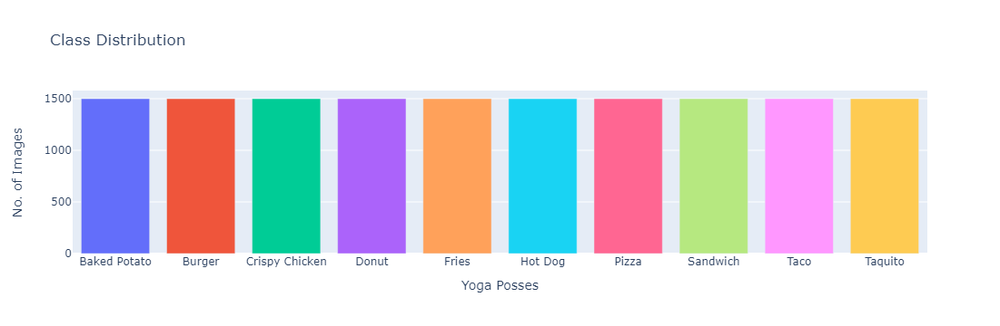

In [10]:
# Compute the number of images per class
n_images_per_class = [len(os.listdir(TRAIN_PATH + f"/{class_name}")) for class_name in class_names]

# Bar graph visualization
bar_graph = px.bar(x=class_names, y=n_images_per_class, title='Class Distribution', color=class_names)
bar_graph.update_layout(
    xaxis_title="Yoga Posses",
    yaxis_title="No. of Images",
    showlegend=False
)
bar_graph.show()

Encountering an anomaly in the realm of **real-world data** is a **rarity**, and this dataset, personally crafted, stands as a **testament to such uniqueness**. A distinctive feature that sets it apart is the **intentional elimination** of **one of the predominant concerns** plaguing **many datasets—class imbalance**.

**Class imbalance** arises when various classes within a **classification task** possess **unequal numbers of samples**. Specifically, in the context of this dataset, differing **class sizes** in terms of **images could potentially introduce bias into the model.** Unequal exposure to different classes during training **may lead the model to develop a preference for those classes with more extensive representation.**

Consider this analogy: Just as **one is more likely to excel in a subject they study more frequently**, a model is **prone to bias** towards **classes with greater exposure during training**. This underscores the importance of achieving a **balanced distribution of images across classes**, ensuring that the model is **trained on a diverse** and **equitable dataset**.

---

$Example:$

> Let's imagine a student preparing for a big physics exam with 10 topics to cover. If the student spends most of their time studying only the first three topics and practices those topics more than the others, they'll likely do really well on those three topics. However, they might not do as well on the remaining seven topics because they didn't focus on them as much. This is similar to what happens with class imbalance in machine learning. When a model sees more examples of certain classes during training, it becomes really good at classifying those classes, but it might not perform as well on the other classes. Just like the student who only studied the first three topics, the model might struggle with the classes it hasn't seen as much. To build a strong and reliable model, we want it to pay attention to all the classes equally, just like how the student should pay attention to all ten topics to score well on the exam.

In [11]:
# Image Data Loader & Augmenter
train_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
)
valid_gen = ImageDataGenerator(rescale=1./255)
test_gen = ImageDataGenerator(rescale=1./255)

Another noteworthy advantage of this dataset is the **substantial amount of data per class**, eliminating the need for **extensive image data augmentation**. With a robust **collection of 1500 images per class**, each class is **adequately represented**, mitigating the necessity for generating virtual data that wasn't part of the **original collection**. This abundance of images ensures a **comprehensive portrayal of each class, contributing to the dataset's richness.**

Given this **ample dataset size**, our **augmentation strategy is streamlined to include scaling, rotation and flips**, without the requirement for **additional transformations.**

---
$Example:$

> Let's continue with our student preparing for the physics exam. Imagine if, along with the textbook, I also provide additional practice questions on the same 10 topics. These extra practice sets allow the student to attempt more questions and get better at solving them. Data augmentation works in a similar way. When we have a limited amount of data, data augmentation applies virtual modifications or filters to the original data to generate more data. This additional virtual data acts like the extra practice questions, while the original data is like the textbook. Just as practicing more questions helps the student improve, augmenting the data helps the model learn better from the available information.

In [12]:

# Training data
train_ds = train_gen.flow_from_directory(
    TRAIN_PATH,
    class_mode='binary',
    shuffle=True,
    seed=RANDOM_SEED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE
)

valid_ds = train_gen.flow_from_directory(
    VALID_PATH,
    class_mode='binary',
    shuffle=False,
    seed=RANDOM_SEED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE
)

# Testing data
test_ds = test_gen.flow_from_directory(
    TEST_PATH,
    class_mode='binary',
    seed=RANDOM_SEED,
    shuffle=True,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE
)

Found 15000 images belonging to 10 classes.

Found 3500 images belonging to 10 classes.

Found 1500 images belonging to 10 classes.


The dataset has been strategically partitioned into three distinct segments: **training**, **testing**, and **validation.** Among these, the **training** and **validation subsets**, comprising **32 instances**, assume paramount importance in the **model development process**. These sets serve as the foundation for **initial model training** and subsequent assessment of its **performance,** respectively. Their collective role is instrumental in shaping the **model's understanding and predictive capabilities**.

The **training set**, as the bedrock of **model formulation**, allows the algorithm to **familiarize itself** with **patterns and features present** in the **data**. Simultaneously, the **validation set** plays a critical role in **fine-tuning the model's parameters and evaluating its generalization performance**. The synergy between these two subsets is pivotal in crafting a **robust and effective model**.

> In contrast, the **testing data**, while equally valuable, holds a **distinct significance**. It represents **real-world examples** that the model has **not encountered** during **training or validation phases**. This set acts as a **litmus test** for the model's ability to **generalize to new and unseen samples, providing a crucial measure of its overall robustness.**

By meticulously delineating these subsets, we ensure a comprehensive evaluation of the model's capabilities, from its foundational learning in the training phase to its validation and, ultimately, its capacity to generalize effectively in real-world scenarios.

In [13]:
# Output Representation
for images, labels in train_ds:

    class_index = int(labels[0])
    one_hot = tf.one_hot(class_index, depth=n_classes).numpy()
    print(f"{'Class Index':20}: {class_index}")
    print(f"{'Class Name':20}: {class_names[class_index]}")
    print(f"{'One Hot':20}: {one_hot}")
    break

Class Index         : 7

Class Name          : Sandwich

One Hot             : [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


When **representing outputs**, we commonly utilize **numerical labels** to denote different **classes**. Each integer corresponds to a **specific class**, providing a convenient way to **interpret model predictions**. For instance, in a dataset with ten classes, if the output is "7," it signifies the "sandwich" class.

Alternatively, we can adopt **one-hot encoding** to represent outputs. With this approach, each class is represented as a **binary vector** where only **one element is set to 1, indicating the class, while all other elements are set to 0**. This method offers a **more explicit representation of class membership**, facilitating tasks such as **multi-class classification**.

Both **numerical labels** and **one-hot encoding** have their **advantages** depending on the **nature of the problem** and the **requirements of the model**. While numerical labels are **straightforward and efficient for single-label classification tasks**, **one-hot encoding** is beneficial for **multi-label classification** or tasks where the **relationships between classes are not ordinal**.


---
$Example:$

> If you're familiar with driving, you know that driving a scooter is often easier than driving a manual motorcycle because scooters have a simpler gear system. Regardless of your choice, the final destination remains the same. The same principle applies to class representation or output representation in machine learning. Whether we use categorical format or binary format, both can lead to similar results or the same outcome. The difference lies in the method used. It's generally found that using categorical or one-hot encoded values is slightly more effective than using integers or direct class indices. This preference is akin to computers finding it easier to work with zeros and ones rather than large numbers. Hence, one-hot encoded vectors are often preferred because they are easier for the model to interpret. However, the difference in performance is usually minimal, so you can choose whichever format suits your needs.

# **Data Visualization**

While we've previously examined the classes and their distribution, it is equally imperative to closely inspect our sample images. Doing so not only grants us a deeper understanding of the dataset but also serves as a catalyst for more informed model development. Analyzing sample images offers valuable insights into the visual characteristics, potential challenges, and nuances present in the dataset. For this, we will look at two different visualizations.

- First, we will look at image from each individual class.
- Then we will look at some random images from our data set.

We'll also go define a function that will show us the images and this function will be compatible at the test time as we will also look at the model predictions at the test time.

In [14]:
# Collect the Directory parts of each class.
dirs = [f"{TRAIN_PATH}/{name}/" for name in class_names]

# Select an image at random from each directory
image_paths = [np.random.choice(glob(directory + '/*')) for directory in dirs]

print("Image Paths:")
image_paths[:5]

Image Paths:


['./Fast Food Classification V2/Train/Baked Potato\\Baked Potato-Train (156).jpeg',
 './Fast Food Classification V2/Train/Burger\\Burger-Train (815).jpeg',
 './Fast Food Classification V2/Train/Crispy Chicken\\Crispy Chicken-Train (957).jpeg',
 './Fast Food Classification V2/Train/Donut\\Donut (437).jpeg',
 './Fast Food Classification V2/Train/Fries\\Fries-Train (119).jpeg']

As you can see now we have random image selected for each yoga pose.

In [22]:
def load_image(image_path):
    """
    Load and preprocess an image from the given file path.

    Parameters:
    - image_path (str): File path of the image.

    Returns:
    - image (tf.Tensor): Processed image tensor.
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMAGE_SIZE)
    image = image/255.
    return image

def show_image(image):
    """
    Display the given image without axis.

    Parameters:
    - image (tf.Tensor): Image tensor to display.
    """
    plt.imshow(image)
    plt.axis('off')

def show_images(data, n_rows, n_cols, figsize=(15,15), model=None, image_paths=False, delimeter="\\"):
    """
    Display a grid of images from the given data.

    Parameters:
    - data (tf.data.Dataset or list): Dataset containing images and labels or list of image file paths.
    - n_rows (int): Number of rows in the display grid.
    - n_cols (int): Number of columns in the display grid.
    - figsize (tuple, optional): Figure size for matplotlib. Default is (15, 15).
    - model (tf.keras.Model, optional): Trained model for making predictions. Default is None.
    - image_paths (bool, optional): True if the data is a list of image file paths. Default is False.
    """
    plt.figure(figsize=figsize)

    if image_paths:
        for index, path in enumerate(data):
            image = load_image(path)
            label = path.split(delimeter)[-2].title()

            plt.subplot(n_rows, n_cols, index+1)
            show_image(image)
            plt.title(label)

    else:
        iterator = iter(data)
        for index in range(n_rows * n_cols):
            try:
                images, labels = next(iterator)
            except StopIteration:
                break

            if model is not None:
                model_pred = model.predict(images, verbose=0)
                model_pred = tf.argmax(model_pred, axis=-1)
                pred_labels = [class_names[index] for index in model_pred]

            for i in range(images.shape[0]):

                if i>=(n_rows * n_cols):
                    break

                plt.subplot(n_rows, n_cols, i + 1)
                show_image(tf.squeeze(images[i]))
                title = class_names[int(labels[i])]

                if model is not None:
                    title = f"T: {title}\nP: {pred_labels[i]}"

                plt.title(title)

    plt.show()


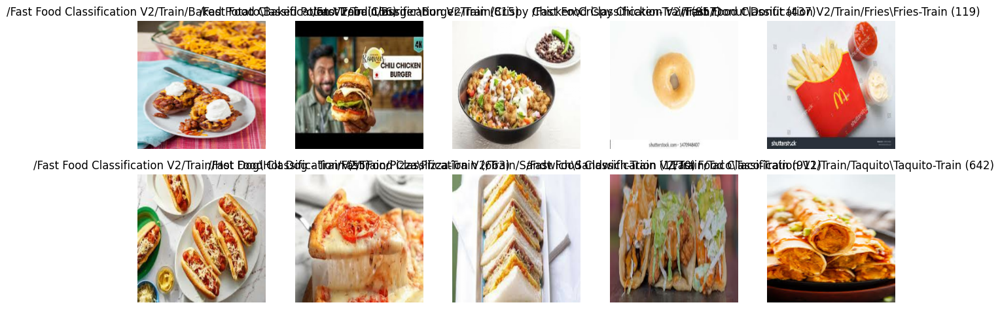

In [26]:
show_images(image_paths, 10, 5, figsize=(15, 30), image_paths=True, delimeter=".")

It's evident that our dataset comprises **10 distinct classes**, each representing a popular **fast food item**. The snapshot above showcases multiple **samples randomly selected** from these **diverse classes**. This serves as out **problem to be tackled**.

D:\miniconda\Lib\site-packages\PIL\Image.py:981: UserWarning:



Palette images with Transparency expressed in bytes should be converted to RGBA images




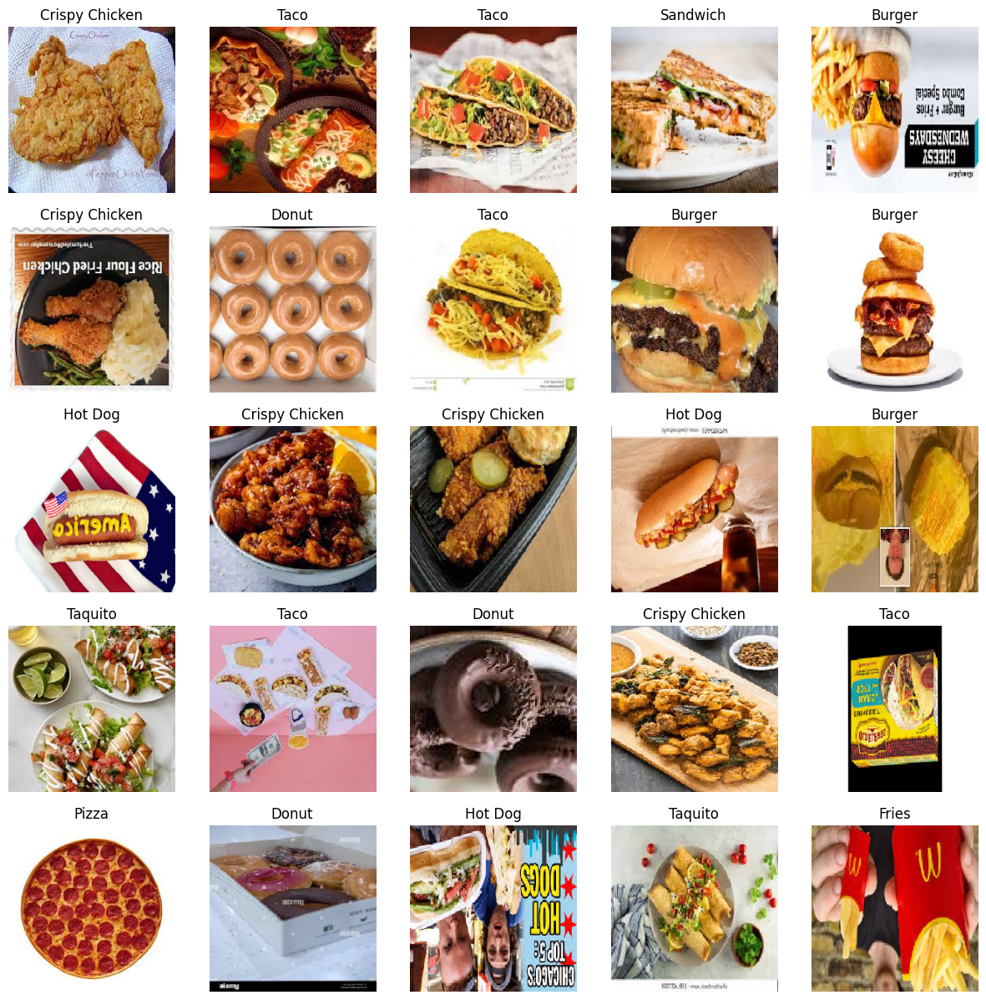

In [17]:
show_images(train_ds, 5, 5)

In [18]:
# show_images(train_ds, 5, 5)
# show_images(train_ds, 5, 5)
# show_images(train_ds, 5, 5)
# show_images(train_ds, 5, 5)

Running it multiple times, you will be able to see that each class has a diverse set of images. This is a good thing, because if the training data consists of images which are diverse, that means that they are covering the different perspectives of the same class. Thus, teaching our model to be robust with respect to the different perspectives.

# **ResNet50V2**

Developing a model marks a **pivotal stage** in our **project lifecycle**, presenting **both challenges and opportunities**. As we embark on this journey, it's crucial to **strike a balance between model complexity and understandability**.

* **Complexity** refers to the **intricacy or depth of the model architecture**, while **understandability** pertains to how **easily interpretable the model is**.

Often, we begin by **crafting simpler models** to grasp the **essence of the task at hand**, gradually progressing towards **more complex architectures**. This approach is particularly common when **building models from scratch**.

However, in contemporary **machine learning practices**, we have access to a **superior technique** called **transfer learning**. This paradigm leverages **pre-trained models' knowledge** to tackle **new tasks efficiently**.

By transferring the **learned representations** from these models, we sidestep the need to **train from scratch** and **fine-tune only the relevant parameters** and **weights**. This strategy yields a **smaller yet potent model**, capable of delivering the **desired results** while significantly **reducing training time and computational resources**.

In [27]:
# Defininig the backbone
backbone = keras.applications.ResNet50V2(input_shape=(*IMAGE_SIZE,3), include_top=False)
backbone.trainable = True


94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 25s 0us/step


In the context of building models using the **transfer learning method**, a **"backbone"** refers to the **foundational architecture** or **pre-trained model** that serves as the **core framework** upon which **additional layers or modifications are added**. The backbone model typically comprises a **deep neural network architecture** that has been trained on a **large-scale dataset** for a **specific task**, such as **image classification** or **natural language processing.**

In [3]:
# Full Model : Backbone + Classidier
model = keras.Sequential([
    layers.Input(shape=(*IMAGE_SIZE, 3)),
    backbone,
    layers.BatchNormalization(),
    layers.Dropout(0.4),
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(n_classes, activation='softmax')
])

NameError: name 'IMAGE_SIZE' is not defined

The **"top classifier"** is an **additional layer** or **set of layers** that is added on **top of the backbone architecture** when utilizing the **transfer learning method**. This classifier serves as the **final component** of the **model** and is responsible for **transforming the extracted features from the backbone into predictions or decisions relevant to the target task.**

The **top classifier** is typically composed of **one or more densely connected layers** followed by an **activation function**, such as **softmax** for **classification tasks** or **sigmoid for binary classification tasks**. These layers are trained or **fine-tuned** using the **features** extracted by the **backbone model**, allowing the model to learn **task-specific patterns and nuances.**

In [29]:
# Model Compilation
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

- **Sparse Categorical Cross Entropy (SCCE)** is a **loss function** commonly used in **classification tasks** where each input sample belongs to **only one category out of multiple classes**. It measures the difference between the **predicted probability distribution** and the **true distribution** of the **classes**.

> The **"sparse"** indicates that the **true labels** are **integers** rather than **one-hot encoded vectors**. This **loss function** is suitable when dealing with **mutually exclusive classes**, and it encourages the model to assign a **high probability to the correct class.**


- **Adam optimizer** is a **popular optimization algorithm** used to update the **weights of a neural network during training**. It combines the concepts of **momentum and adaptive learning rates** to achieve **efficient convergence**. **Adam** adapts the **learning rate** for each parameter based on the **first and second moments of the gradients**, allowing it to **converge quickly** and **effectively** even in the presence of **noisy or sparse gradients**. It is widely used due to its **robustness, simplicity, and effectiveness across a variety of deep learning tasks.**

In [30]:
# Define LR Scheduler
lr_scheduler = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',                              # Monitor validation loss
    factor=0.2,                                      # Factor by which learning rate will be reduced (new_lr = lr * factor)
    patience=3,                                      # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-6,                                     # Lower bound on the learning rate
    verbose=1                                        # Verbosity mode
)

A **learning rate scheduler**, specifically the **Reduced Learning Rate on Plateau**, is a technique used to **adjust the learning rate** during **training** based on **certain conditions**. In the case of the **"on plateau" variant**, the scheduler monitors a **chosen metric** (e.g., **validation loss**) and reduces the **learning rate** if the **monitored metric stops improving for a specified number of epochs**.

This helps **fine-tune** the **learning process**, allowing the model to **progress more effectively** through periods of **stagnation or plateauing in performance**. It ensures that the **model's learning rate adapts dynamically** to the **training process**, potentially leading to **improved convergence and performance.**

In [ ]:
# Training the model
history = model.fit(
    train_ds,
    epochs=12,
    validation_data=valid_ds,
    callbacks=[
        keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        lr_scheduler,
        keras.callbacks.ModelCheckpoint(
            "FastFood-ResNet.keras",
            monitor="val_accuracy",
            save_best_only=True
        )
    ]
)

Epoch 1/100


2024-03-18 07:43:47.663621: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


235/235 [==============================] - 251s 968ms/step - loss: 1.0022 - accuracy: 0.6865 - val_loss: 0.6935 - val_accuracy: 0.7943 - lr: 1.0000e-04

Epoch 2/100

235/235 [==============================] - 212s 901ms/step - loss: 0.4769 - accuracy: 0.8577 - val_loss: 0.5816 - val_accuracy: 0.8260 - lr: 1.0000e-04

Epoch 3/100

235/235 [==============================] - 234s 998ms/step - loss: 0.3416 - accuracy: 0.8980 - val_loss: 0.6428 - val_accuracy: 0.8117 - lr: 1.0000e-04

Epoch 4/100

235/235 [==============================] - 208s 885ms/step - loss: 0.2686 - accuracy: 0.9199 - val_loss: 0.6227 - val_accuracy: 0.8237 - lr: 1.0000e-04

Epoch 5/100

235/235 [==============================] - ETA: 0s - loss: 0.2221 - accuracy: 0.9328

Epoch 5: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.

235/235 [==============================] - 210s 894ms/step - loss: 0.2221 - accuracy: 0.9328 - val_loss: 0.6006 - val_accuracy: 0.8271 - lr: 1.0000e-04

Epoch 6/100

235/23

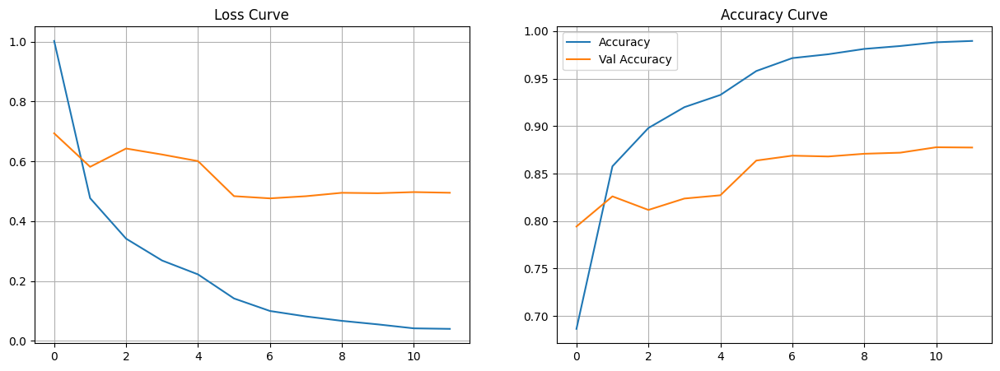

In [36]:
# Learning Curve
history_df = pd.DataFrame(history.history)
plt.figure(figsize=(15, 5))

# Loss Curve
plt.subplot(1,2,1)
plt.title("Loss Curve")
plt.plot(history_df['loss'], label="Loss")
plt.plot(history_df['val_loss'], label="Val Loss")
plt.grid()

# Accuracy Curve
plt.subplot(1,2,2)
plt.title("Accuracy Curve")
plt.plot(history_df['accuracy'], label="Accuracy")
plt.plot(history_df['val_accuracy'], label="Val Accuracy")
plt.grid()

# Plot Configs
plt.legend()
plt.savefig("LearningCurve.png")
plt.show()

In [35]:
# img = plt.imread(LC_PATH)
# plt.figure(figsize=(15, 10))
# plt.imshow(img)
# plt.axis('off')
# plt.show()

Looking at the **learning curve**, we can **easily identify** that the **model is overfitting** the training data. However, it's **equally important** to evaluate its **performance on the testing data** before drawing conclusions. This ensures that any observations made are **not solely due to anomalies in the validation dataset.**

Although **overfitting is predominant**, the chosen model is equipped with **several measures** to mitigate its effects. We've incorporated **dropout**, **batch normalization**, **data augmentation**, and **learning rate schedulers** to enhance the model's robustness. While the current **model may not be the optimal solution**, it is still **satisfactory**. Moving forward, we can continue refining the **model to achieve better performance.**




---
$Example:$

> Transfer learning is like going to a library to learn about a topic. You have two options: either conduct experiments and gather knowledge from scratch, or utilize pre-existing resources like books or YouTube videos. Creating a model from scratch is similar to the first option, where the model learns from trial and error.

> On the other hand, transfer learning is akin to using pre-existing knowledge sources. Just like browsing through YouTube videos to find the best one, transfer learning selects from various pre-trained models like MobileNet, ResNet, or EfficientNet. However, choosing the right model for a specific problem can be challenging, requiring careful evaluation of each option to find the most suitable one.

# **Model Saving & Loading**

To **safeguard against** the **loss of valuable progress and achievements**, it is imperative to **save the model diligently**. Fortunately, this essential task can be accomplished with a **single line of code**. This prudent measure ensures that the **model's state is preserved**, allowing for **easy retrieval and continuation of work, even after sessions are closed.**

In the **realm of model development**, where **accuracy and progress are hard-earned**, the act of **safeguarding** the **model** becomes a **paramount responsibility**. Adopting this practice ensures that the **fruits of your labor persist and contribute to the ongoing success of the project.**

In [2]:
# # Model Saving with overwrite=True
model.save('FinalModel.h5', overwrite=True)

NameError: name 'model' is not defined

In [ ]:
# Load Model
MODEL_PATH = '/kaggle/input/fast-food-classifier/FinalModel.h5'
final_model = keras.models.load_model(MODEL_PATH)

# Final model architecture
# final_model.summary()

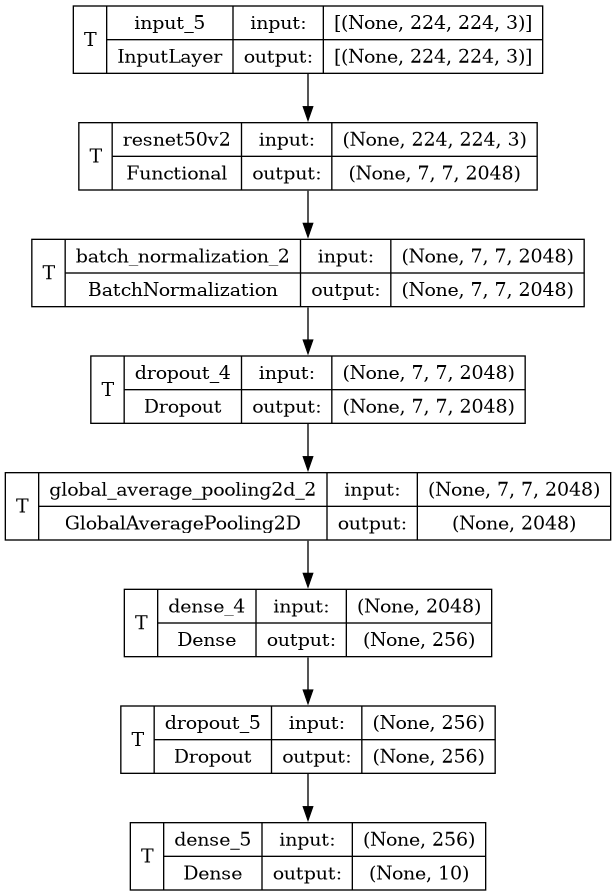

In [40]:
# Visualize Model Architecture
keras.utils.plot_model(
    final_model,
    to_file="FinalModel.png",
    show_shapes=True,
    show_trainable=True,
    dpi=96
)

Using the **provided code**, we obtain a **visual representation of the model's architecture**, allowing us to **understand its structure in a sequential manner** from the **input layer** to the **output layer**.

In this **visualization**, we observe that our model takes an **input image** of size **224 by 224 pixels with 3 channels**, representing an **RGB image**. The model then processes this **input and produces an output consisting of 10 values**. Each of these **10 values** corresponds to a **specific class**, indicating the **likelihood of the input image belonging to that particular class**.

In [41]:
# Model Evaluation
loss, acc = final_model.evaluate(test_ds, verbose=0)
print(f"Loss: {loss}\nAccuracy: {round(acc*100, 2)}%")

Loss: 0.42610472440719604

Accuracy: 88.73%


**Testing** the **model's performance** on the **testing data**, we achieved **88% accuracy**, which is really the **best till now**. I have tried out **multiple models**, yet this **one turns out to be the best.**

# **Model Predictions**

Once we've **developed** and **loaded** our **final model**, it's prudent to conduct a **visual inspection** of its **predictions**. While mathematical evaluation on the test set provides valuable metrics, visual analysis offers additional insights into the model's performance. By **visually examining** the model's predictions on the **test data**, we can gain a **deeper understanding** of its **strengths and weaknesses**. Sometimes, the **model may not perform as expected**, and **visual inspection** enables us to **identify specific samples or patterns where it struggles.**

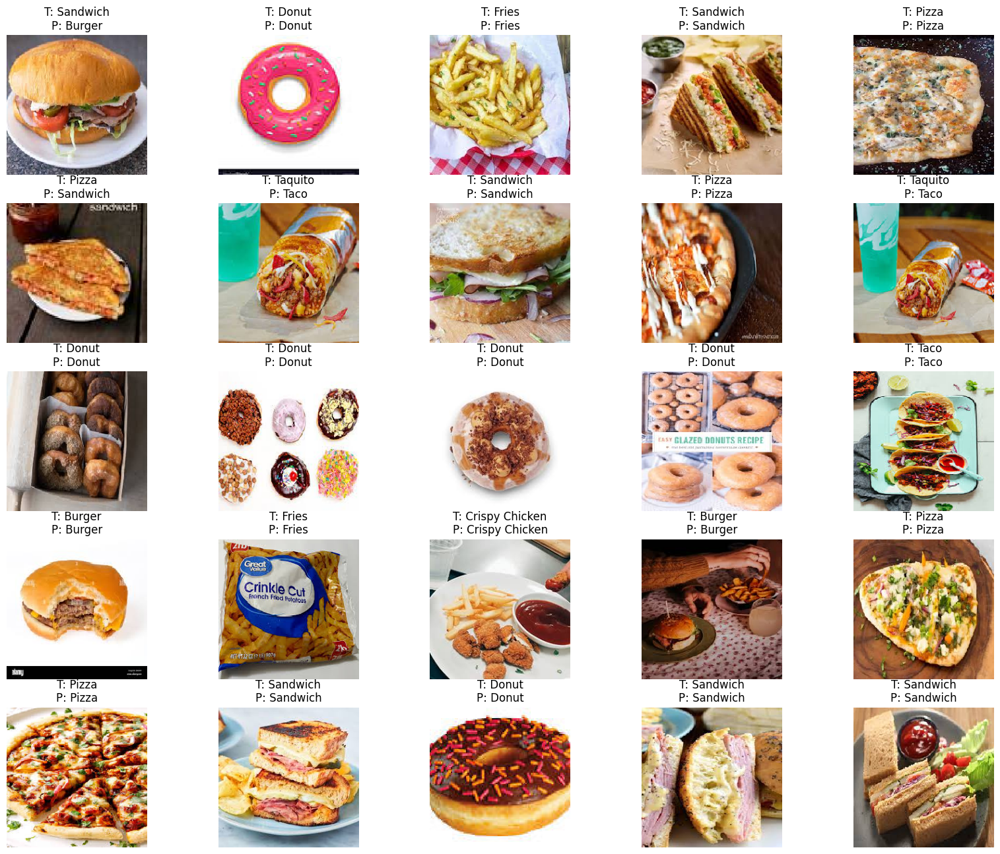

In [48]:
show_images(test_ds, 5, 5, model=final_model, figsize=(20, 16))

In [49]:
# show_images(test_ds, 5, 5, model=final_model, figsize=(20, 20))
# show_images(test_ds, 5, 5, model=final_model, figsize=(20, 20))
# show_images(test_ds, 5, 5, model=final_model, figsize=(20, 20))
# show_images(test_ds, 5, 5, model=final_model, figsize=(20, 20))

After **successfully developing a model** that accurately **classifies images** of various types of **fast food**, our next step is to make this **model accessible to others**. Currently, the **model resides** locally and is **not available for broader use**. To address this, our next task is to deploy **the model on the web**.

In the context of **project development**, **deploying the model** is crucial for integrating it into the **intended product or system**. Whether it's an **edge device**, an **online platform**, or a **local application,** deploying the model allows it to be **efficiently utilized** within that **ecosystem**. **TensorFlow** provides powerful **tools and frameworks** to facilitate the **deployment process**, enabling seamless integration of the model into **various applications and environments**.

By deploying the **model**, we can unlock its **potential to benefit** a **wider audience**, making it **accessible and usable in real-world scenarios**. This step marks the transition from **model development** to **practical implementation**, bringing the **fruits of our efforts to fruition.**

---
**By MLSA**

# **Tensorflow JS**

In order to deploy our model on the web, we will need our model in a different format known as the tensorflow javascript (simply **JSON**) format.

In [53]:
!tensorflowjs_converter --input_format keras {MODEL_PATH} './Model'
!zip -r Model.zip Model

2024-03-18 08:43:17.102190: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered

2024-03-18 08:43:17.102243: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered

2024-03-18 08:43:17.103632: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered

  adding: Model/ (stored 0%)

  adding: Model/group1-shard19of23.bin (deflated 7%)

  adding: Model/group1-shard18of23.bin (deflated 7%)

  adding: Model/group1-shard2of23.bin (deflated 7%)

  adding: Model/group1-shard11of23.bin (deflated 7%)

  adding: Model/group1-shard22of23.bin (deflated 7%)

  adding: Model/group1-shard16of23.bin (deflated 7%)

  adding:

After running the above code, we will have a **Model.zip** file. We need to download this **zip file** as it will be required when we will be creating the **web page**.

---
**By MLSA**